<a href="https://colab.research.google.com/github/koksal100/Deep-Learning/blob/main/MultiClass_Image_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [27]:
import tensorflow as tf
import numpy as np
import pathlib
import os
import random
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [6]:
!nvidia-smi

Mon Feb  5 22:07:51 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [7]:
!ls

drive  sample_data


['sunrise89.jpeg']
['shine228.jpg']
['cloudy232.jpg']
['shine145.jpg']


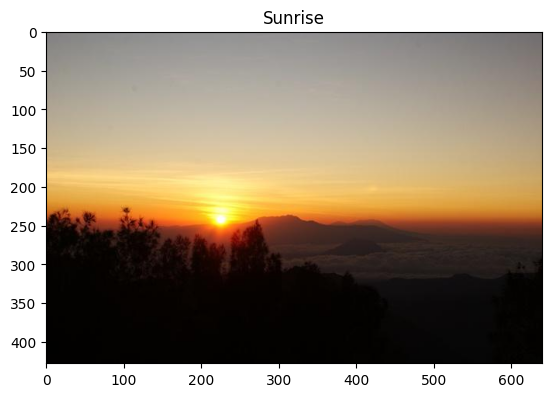

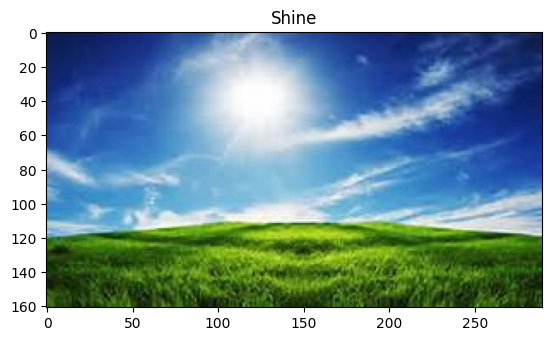

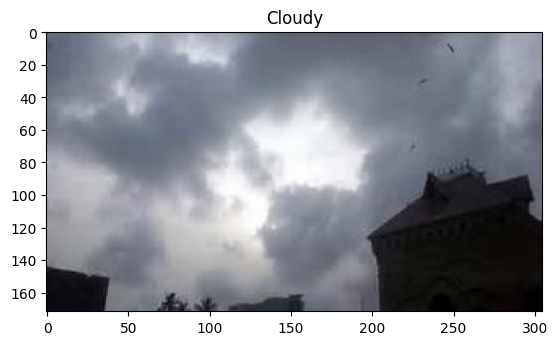

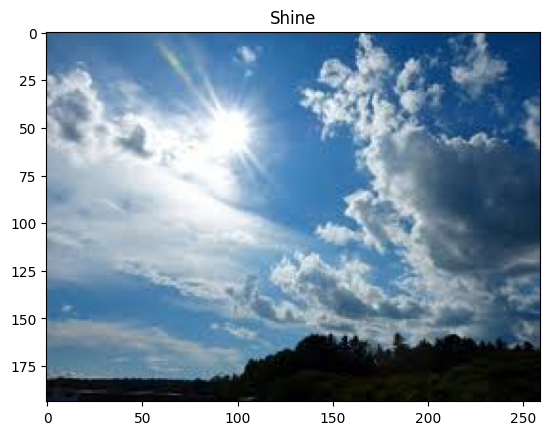

In [45]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
def view_random_weather_image():
  plt.figure()
  weather_name=os.listdir("/content/drive/MyDrive/Colab Notebooks/WeatherDataset")[np.random.randint(4)]
  weather_dir="/content/drive/MyDrive/Colab Notebooks/WeatherDataset"+"/"+weather_name
  file_name=random.sample(os.listdir(weather_dir),1)
  print(file_name)
  file_dir=weather_dir+"/"+file_name[0]
  image=mpimg.imread(file_dir)
  plt.imshow(image)
  plt.title(weather_name)
view_random_weather_image()
view_random_weather_image()
view_random_weather_image()
view_random_weather_image()

In [47]:
for dirpath, dirnames, filenames in os.walk("/content/drive/MyDrive/Colab Notebooks/WeatherDataset"):
  print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'.")

There are 4 directories and 0 images in '/content/drive/MyDrive/Colab Notebooks/WeatherDataset'.
There are 0 directories and 215 images in '/content/drive/MyDrive/Colab Notebooks/WeatherDataset/Rain'.
There are 0 directories and 357 images in '/content/drive/MyDrive/Colab Notebooks/WeatherDataset/Sunrise'.
There are 0 directories and 300 images in '/content/drive/MyDrive/Colab Notebooks/WeatherDataset/Cloudy'.
There are 0 directories and 253 images in '/content/drive/MyDrive/Colab Notebooks/WeatherDataset/Shine'.


In [49]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator


datagen=ImageDataGenerator(rescale=1./255,validation_split=0.2)
data_dir="/content/drive/MyDrive/Colab Notebooks/WeatherDataset"


train_data = datagen.flow_from_directory(data_dir,
                                              target_size=(224, 224),
                                              batch_size=32,
                                              class_mode="categorical",
                                              subset="training",  # Use "training" for the training set
                                              seed=42,
                                              shuffle=True)

# Use flow_from_directory for test data
test_data = datagen.flow_from_directory(data_dir,
                                             target_size=(224, 224),
                                             batch_size=32,
                                             class_mode="categorical",
                                             subset="validation",  # Use "validation" for the test set
                                             seed=42,
                                              shuffle=True)

Found 901 images belonging to 4 classes.
Found 224 images belonging to 4 classes.


In [50]:
train_data.batch_size,train_data.image_shape

(32, (224, 224, 3))

In [51]:
train_data.samples,train_data.color_mode

(901, 'rgb')

In [54]:
model1=tf.keras.Sequential([
    tf.keras.layers.Conv2D(filters=10,
                           kernel_size=3,
                           padding="valid",
                           activation="relu",
                           input_shape=(224,224,3)),
    tf.keras.layers.Conv2D(10,3,activation="relu"),
    tf.keras.layers.MaxPool2D(2),
    tf.keras.layers.Conv2D(10,3,activation="relu"),
    tf.keras.layers.Conv2D(10,3,activation="relu"),
    tf.keras.layers.MaxPool2D(2),
    tf.keras.layers.Conv2D(10,3,activation="relu"),
    tf.keras.layers.Conv2D(10,3,activation="relu"),
    tf.keras.layers.MaxPool2D(2),
    tf.keras.layers.Conv2D(10,3,activation="relu"),
    tf.keras.layers.Conv2D(10,3,activation="relu"),
    tf.keras.layers.MaxPool2D(2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(4,activation="softmax")
])

model1.compile(loss="categorical_crossentropy",
              optimizer=tf.keras.optimizers.Adam(),
              metrics=["accuracy"])

history_1 = model1.fit(train_data,
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=len(test_data))

Epoch 1/5
29/29 [==============================] - 49s 2s/step - loss: 1.2940 - accuracy: 0.4062 - val_loss: 1.0849 - val_accuracy: 0.4911
Epoch 2/5
29/29 [==============================] - 11s 379ms/step - loss: 0.8128 - accuracy: 0.6526 - val_loss: 0.9703 - val_accuracy: 0.5446
Epoch 3/5
29/29 [==============================] - 10s 328ms/step - loss: 0.6407 - accuracy: 0.7236 - val_loss: 0.7627 - val_accuracy: 0.6250
Epoch 4/5
29/29 [==============================] - 10s 362ms/step - loss: 0.5259 - accuracy: 0.7647 - val_loss: 0.9733 - val_accuracy: 0.6250
Epoch 5/5
29/29 [==============================] - 11s 373ms/step - loss: 0.5796 - accuracy: 0.7547 - val_loss: 0.9130 - val_accuracy: 0.6429


<Axes: >

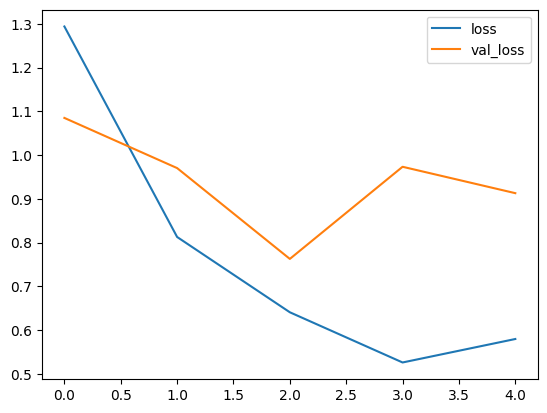

In [61]:
import pandas as pd
pd.DataFrame(history_1.history)[["loss","val_loss"]].plot()


In [58]:
import tensorflow_hub as hub

model2 = tf.keras.Sequential([
    hub.KerasLayer("https://www.kaggle.com/models/tensorflow/efficientnet/frameworks/TensorFlow2/variations/b0-feature-vector/versions/1",
                   trainable=False),  # Can be True, see below.
    tf.keras.layers.Dense(4, activation='softmax')
])

model2.compile(loss='categorical_crossentropy',
                     optimizer=tf.keras.optimizers.Adam(),
                     metrics=['accuracy'])
history2=model2.fit(train_data,
          epochs=5,
          steps_per_epoch=len(train_data),
          validation_data=test_data,
          validation_steps=len(test_data))

Epoch 1/5
29/29 [==============================] - 20s 386ms/step - loss: 0.8882 - accuracy: 0.6804 - val_loss: 0.5593 - val_accuracy: 0.8482
Epoch 2/5
29/29 [==============================] - 15s 539ms/step - loss: 0.3933 - accuracy: 0.9168 - val_loss: 0.3962 - val_accuracy: 0.8929
Epoch 3/5
29/29 [==============================] - 9s 326ms/step - loss: 0.2620 - accuracy: 0.9567 - val_loss: 0.3207 - val_accuracy: 0.9018
Epoch 4/5
29/29 [==============================] - 9s 325ms/step - loss: 0.2013 - accuracy: 0.9689 - val_loss: 0.2837 - val_accuracy: 0.9018
Epoch 5/5
29/29 [==============================] - 9s 322ms/step - loss: 0.1656 - accuracy: 0.9745 - val_loss: 0.2569 - val_accuracy: 0.9018


<Axes: >

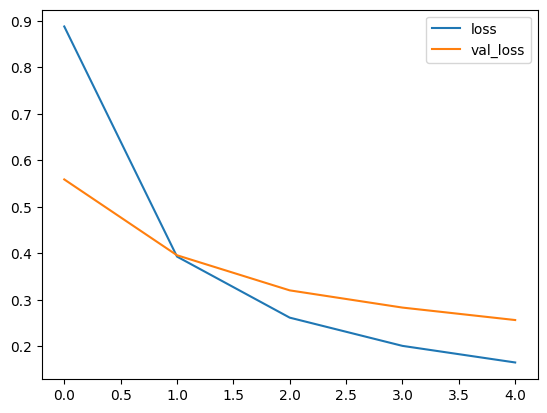

In [62]:
pd.DataFrame(history2.history)[["loss","val_loss"]].plot()


In [63]:
#Although ı have not used the augmented data, efficientnet model worked very well.
#Next step will be using augmented data.

In [68]:
datagen = ImageDataGenerator(                 rescale=1/255.,validation_split=0.2,
                                             rotation_range=20, # rotate the image slightly between 0 and 20 degrees (note: this is an int not a float)
                                             shear_range=0.2, # shear the image
                                             zoom_range=0.2, # zoom into the image
                                             width_shift_range=0.2, # shift the image width ways
                                             height_shift_range=0.2, # shift the image height ways
                                             horizontal_flip=True,) # flip the image on the horizontal axis

train_data = datagen.flow_from_directory(data_dir,
                                              target_size=(224, 224),
                                              class_mode="categorical",
                                              subset="training",  # Use "training" for the training set
                                              seed=42,
                                              shuffle=True)

# Use flow_from_directory for test data
test_data = datagen.flow_from_directory(data_dir,
                                             target_size=(224, 224),
                                             class_mode="categorical",
                                             subset="validation",  # Use "validation" for the test set
                                             seed=42,
                                              shuffle=True)

Found 901 images belonging to 4 classes.
Found 224 images belonging to 4 classes.


In [69]:
history3=model2.fit(train_data,
          epochs=5,
          steps_per_epoch=len(train_data),
          validation_data=test_data,
          validation_steps=len(test_data))

Epoch 1/5
29/29 [==============================] - 24s 812ms/step - loss: 0.2260 - accuracy: 0.9445 - val_loss: 0.3120 - val_accuracy: 0.8973
Epoch 2/5
29/29 [==============================] - 23s 806ms/step - loss: 0.1623 - accuracy: 0.9656 - val_loss: 0.2703 - val_accuracy: 0.9241
Epoch 3/5
29/29 [==============================] - 25s 861ms/step - loss: 0.1504 - accuracy: 0.9645 - val_loss: 0.2387 - val_accuracy: 0.9286
Epoch 4/5
29/29 [==============================] - 24s 818ms/step - loss: 0.1330 - accuracy: 0.9689 - val_loss: 0.2871 - val_accuracy: 0.9018
Epoch 5/5
29/29 [==============================] - 23s 804ms/step - loss: 0.1237 - accuracy: 0.9678 - val_loss: 0.2604 - val_accuracy: 0.8839


<Axes: >

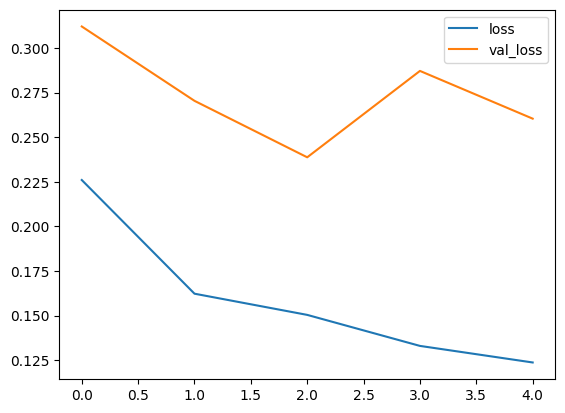

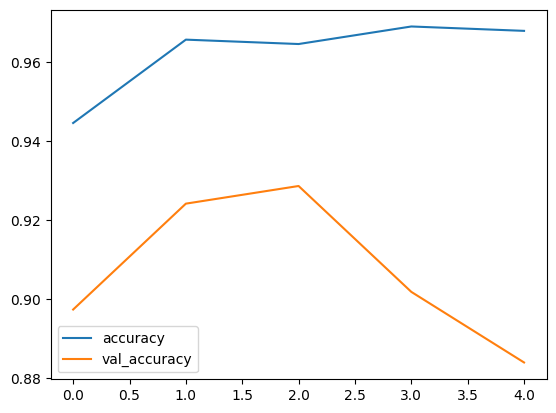

In [74]:
pd.DataFrame(history3.history)[["loss","val_loss"]].plot()
pd.DataFrame(history3.history)[["accuracy","val_accuracy"]].plot()

In [ ]:
#After the 3. epoch model show overfitting and then it continued to learning and decreasing the val_loss by 0.02
#After the 3. epoch val_accuracy decrease until the and.


In [75]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

model_checkpoint = ModelCheckpoint('best_model.h5', save_best_only=True)

history4=model2.fit(train_data,
          epochs=15,
          steps_per_epoch=len(train_data),
          validation_data=test_data,
          validation_steps=len(test_data),
                    callbacks=[model_checkpoint,early_stopping])

Epoch 1/15
29/29 [==============================] - ETA: 0s - loss: 0.1172 - accuracy: 0.9700

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


29/29 [==============================] - 24s 811ms/step - loss: 0.1172 - accuracy: 0.9700 - val_loss: 0.2426 - val_accuracy: 0.9018
Epoch 2/15
29/29 [==============================] - 23s 811ms/step - loss: 0.1158 - accuracy: 0.9689 - val_loss: 0.2669 - val_accuracy: 0.8929
Epoch 3/15
29/29 [==============================] - 24s 838ms/step - loss: 0.0994 - accuracy: 0.9789 - val_loss: 0.2306 - val_accuracy: 0.9196
Epoch 4/15
29/29 [==============================] - 27s 927ms/step - loss: 0.0934 - accuracy: 0.9778 - val_loss: 0.2212 - val_accuracy: 0.9241
Epoch 5/15
29/29 [==============================] - 23s 814ms/step - loss: 0.0876 - accuracy: 0.9845 - val_loss: 0.2448 - val_accuracy: 0.8839
Epoch 6/15
29/29 [==============================] - 22s 773ms/step - loss: 0.0934 - accuracy: 0.9711 - val_loss: 0.2437 - val_accuracy: 0.9018
Epoch 7/15
29/29 [==============================] - 25s 859ms/step - loss: 0.0866 - accuracy: 0.9778 - val_loss: 0.2182 - val_accuracy: 0.9152
Epoch 8/15

In [ ]:
#After 15 epoch we can say that the model reached best performance at the 11. epoch.
#Early callBack save the best parameters for the model.
#So if the model would be evaluated with the test data the parameters will be same with the 11.th epoch not the last one.

In [80]:
model2.evaluate(test_data)

7/7 [==============================] - 5s 628ms/step - loss: 0.1804 - accuracy: 0.9196


[0.1803659051656723, 0.9196428656578064]

In [81]:
model2.evaluate(test_data)

7/7 [==============================] - 5s 647ms/step - loss: 0.1944 - accuracy: 0.9241


[0.19439886510372162, 0.9241071343421936]

In [82]:
#The result show differencies even with the same dataset at different times but val_loss points that model parameters belongs to the 11.th epoch.

In [83]:
#With the help of the model_checkpoint callbacks the model was saved to the current directory.

In [88]:
#If any additional layer which came from outher module -like efficientnet- was used in that saved model
#Then ıt should be specified in the custom_objects parameter of load_model function.Then the model could be loaded.
from tensorflow.keras.models import load_model
best_model = load_model("/content/best_model.h5", custom_objects={'KerasLayer': hub.KerasLayer})
best_model.evaluate(test_data)


7/7 [==============================] - 7s 773ms/step - loss: 0.2142 - accuracy: 0.9241


[0.21420933306217194, 0.9241071343421936]

In [101]:
model2.layers[1].get_weights()

[array([[ 0.01942441, -0.02278733, -0.02180106, -0.08028968],
        [ 0.03082345,  0.03923698,  0.01976882,  0.01832013],
        [-0.11786104,  0.01523126, -0.16780011,  0.0597767 ],
        ...,
        [ 0.03520293, -0.00407894,  0.00318552, -0.05994092],
        [-0.0301059 , -0.08597459, -0.11088871,  0.11781061],
        [ 0.05874708,  0.02618996, -0.08051869, -0.0568778 ]],
       dtype=float32),
 array([ 0.01069989, -0.0039811 ,  0.01894548, -0.01919284], dtype=float32)]

In [102]:
best_model.layers[1].get_weights()

[array([[ 0.01604993, -0.02683003, -0.01934522, -0.07722771],
        [ 0.0265302 ,  0.03826538,  0.02096083,  0.02289181],
        [-0.11874483,  0.01242856, -0.16219713,  0.05790086],
        ...,
        [ 0.03610737, -0.00294926, -0.00405346, -0.05282233],
        [-0.02920642, -0.08393575, -0.10769691,  0.11166438],
        [ 0.05523628,  0.0254594 , -0.07970476, -0.05206352]],
       dtype=float32),
 array([ 0.01095334, -0.00521328,  0.01786013, -0.01743937], dtype=float32)]

In [125]:
#Last layer of the models belong the output layer.
#First layer of the models belong the efficientNet feature extractor layer.
(len(best_model.layers[0].get_weights()),
len(best_model.layers[0].get_weights()[0]),
len(best_model.layers[0].get_weights()[0][0]),
len(best_model.layers[0].get_weights()[0][0][0]),
len(best_model.layers[0].get_weights()[0][0][0][0]),
(best_model.layers[0].get_weights()[0][0][0][0][0]))#this one ist just a number


(309, 3, 3, 3, 32, 0.020766824)

In [174]:
import matplotlib.pyplot as plt

1/1 [==============================] - 0s 27ms/step


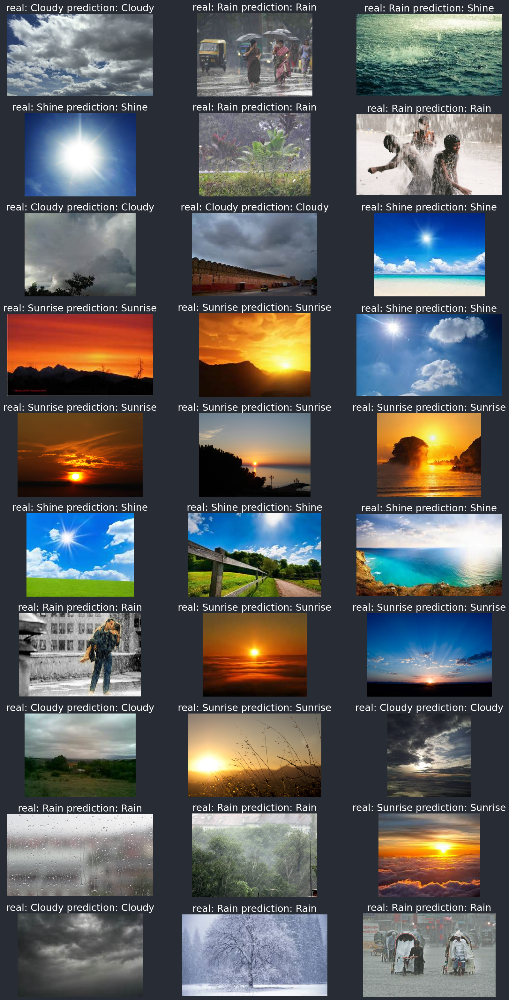

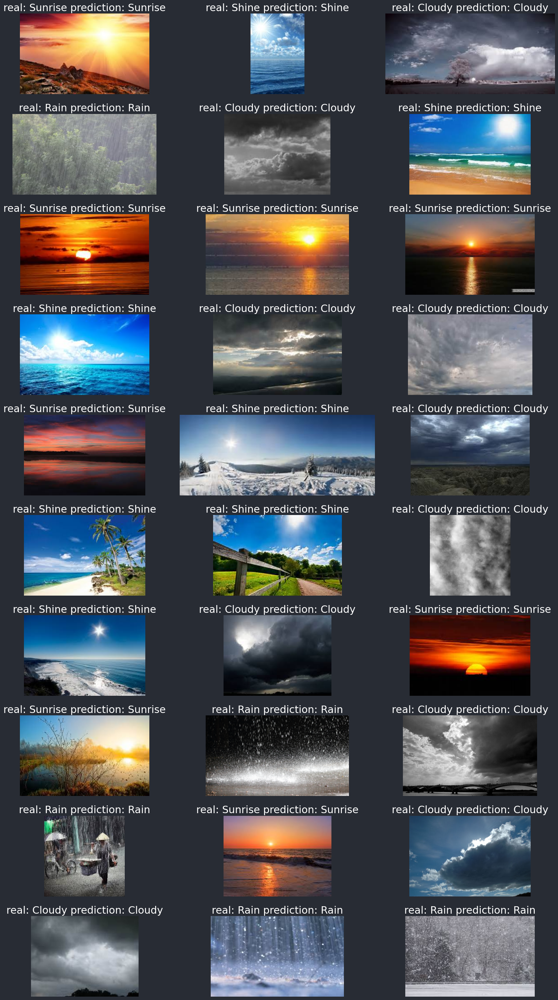

In [180]:
class_names = sorted(os.listdir("/content/drive/MyDrive/Colab Notebooks/WeatherDataset"))
plt.rcParams.update({'font.size': 18})

def predict_random_image():
    fig, axs = plt.subplots(10, 3, figsize=(18, 30), facecolor='#282c34')

    for i in range(30):
        ax = axs[i // 3, i % 3]
        target_folder = class_names[np.random.randint(4)]
        target_dir = "/content/drive/MyDrive/Colab Notebooks/WeatherDataset/" + target_folder
        random_image = random.sample(os.listdir(target_dir), 1)
        img = mpimg.imread(target_dir + "/" + random_image[0])
        resized_image = tf.image.resize(img, (224, 224))
        resized_image = resized_image / 255.
        prediction = (model2.predict(tf.expand_dims(resized_image, axis=0)).argmax())
        ax.imshow(img)
        prediction = class_names[prediction]
        ax.set_title("real: " + target_folder + " prediction: " + prediction, color='white')
        ax.axis("off")

    plt.tight_layout()
    plt.show()

predict_random_image()